Testing py script.

In [1]:
import sys
sys.path.insert(1, "/dss/dsshome1/0C/ra98gaq/Git/cellseg-benchmark")

In [2]:
import argparse
import logging
from pathlib import Path

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import scanpy as sc
from matplotlib.pyplot import rc_context

from cellseg_benchmark._constants import (
    cell_type_colors,
    contamination_markers,
    selected_EC_subtypes,
)
from cellseg_benchmark.adata_utils import (
    clean_pca_umap,
    pca_umap_single,
    integration_harmony,
    normalize_counts,
    plot_integration_comparison
)
from cellseg_benchmark.cell_annotation_utils import (
    annotate_cells_by_score,
    flag_contamination,
    score_cell_types,
)

In [3]:
import importlib
import cellseg_benchmark.adata_utils
importlib.reload(cellseg_benchmark.adata_utils)

<module 'cellseg_benchmark.adata_utils' from '/dss/dsshome1/0C/ra98gaq/Git/cellseg-benchmark/cellseg_benchmark/adata_utils.py'>

In [4]:
# Logger Setup
logger = logging.getLogger("vascular_subtyping")
logger.setLevel(logging.INFO)
handler = logging.StreamHandler()
handler.setFormatter(logging.Formatter("%(asctime)s [%(levelname)s]: %(message)s"))
logger.addHandler(handler)

In [5]:
# CLI arguments
parser = argparse.ArgumentParser(
    description="Identify vascular subtypes, including EC zonation"
)
parser.add_argument("cohort", help="Cohort name, e.g., 'foxf2'")
parser.add_argument(
    "seg_method", help="Segmentation method, e.g., 'Cellpose_1_nuclei_model'"
)
#args = parser.parse_args()

# Simulate CLI args in Jupyter
args = parser.parse_args(["foxf2", "Cellpose_1_nuclei_model"])
print(args.cohort)
print(args.seg_method)


foxf2
Cellpose_1_nuclei_model


In [6]:
# Paths
base_path = Path("/dss/dssfs03/pn52re/pn52re-dss-0001/cellseg-benchmark")
method_path = base_path / "analysis" / args.cohort / args.seg_method
plot_path = method_path / "plots" / "vascular-subtypes"
plot_path_ecs = method_path / "plots" / "ec-zonation"
plot_path_spat = plot_path / "Spatial"
results_path = method_path / "vascular-subtypes"
adata_path = method_path / "adatas"

for p in [plot_path, plot_path_ecs, plot_path_spat, results_path, adata_path]:
    p.mkdir(parents=True, exist_ok=True)

In [7]:
logger.info("Loading integrated adata...")
adata = sc.read_h5ad(adata_path / "adata_integrated.h5ad.gz")

2025-11-03 18:33:17,980 [INFO]: Loading integrated adata...


In [8]:
# Prepare metadata
cell_type_col = "cell_type_revised"
adata.obs[cell_type_col] = pd.Categorical(
    adata.obs[cell_type_col], categories=list(cell_type_colors.keys())
).remove_unused_categories()
adata.uns[f"{cell_type_col}_colors"] = [
    cell_type_colors[ct] for ct in adata.obs[cell_type_col].cat.categories
]

In [9]:
adata.obs.volume_final.mean()

np.float64(1464.5652173724698)

In [10]:
adata.obs.columns

Index(['region', 'slide', 'cell_type_incl_low_quality_revised',
       'cell_type_mmc_incl_low_quality_clusters',
       'cell_type_mmc_incl_low_quality', 'cell_type_incl_mixed_revised',
       'cell_type_mmc_incl_mixed_clusters', 'cell_type_mmc_incl_mixed',
       'cell_type_revised', 'cell_type_mmc_raw_clusters', 'cell_type_mmc_raw',
       'area', 'volume_sum', 'volume_final', 'num_z_planes', 'size_normalized',
       'surface_to_volume_ratio', 'sphericity', 'solidity', 'elongation',
       'genotype', 'age_months', 'condition', 'run_date', 'animal_id',
       'organism', 'cohort', 'sample', 'n_counts', 'n_genes',
       'spatial_outlier', 'low_quality_cell', 'volume_outlier_cell', 'fov'],
      dtype='object')

In [11]:
## Use the dictionary keys as the cell type order
#adata.obs[cell_type_column] = pd.Categorical(
#    adata.obs[cell_type_column], categories=list(cell_type_colors.keys())
#)
#adata.obs[cell_type_column] = adata.obs[cell_type_column].cat.remove_unused_categories()
#
## set colors for allen_cell_type
#colors = [cell_type_colors[cat] for cat in adata.obs[cell_type_column].cat.categories]
#adata.uns[cell_type_column+"_colors"] = colors

In [ ]:
logger.info("Subsetting vascular cells...")
vascular_types = ["ECs", "SMCs", "Pericytes", "VLMCs", "BAMs"]
sub_adata = adata[adata.obs[cell_type_col].isin(vascular_types)].copy()
del adata

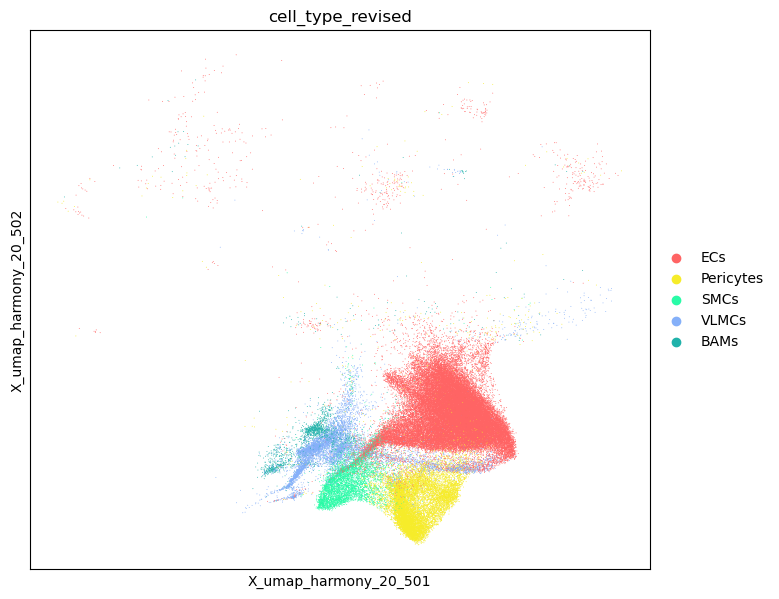

In [13]:
with rc_context({"figure.figsize": (8, 7)}):
    sc.pl.embedding(
        sub_adata, basis="X_umap_harmony_20_50", color=cell_type_col, show=False
    )
    #plt.savefig(
    #    plot_path / "UMAP_integrated_harmony_subset.png", dpi=200, bbox_inches="tight"
    #)
    plt.show()

2025-11-03 17:47:41,489 [INFO]: Filtering out contaminated cells...
2025-11-03 17:47:41,491 [INFO]: Marker expression distribution check
2025-11-03 17:47:41,492 [INFO]: ==================================================
2025-11-03 17:47:41,618 [INFO]: Immune          Markers:  5/ 5 | Expr > 1.0:    15 | Pctl (90/95/99): 0.29/0.36/0.57 | Max: 1.38
2025-11-03 17:47:41,735 [INFO]: Neuronal        Markers:  5/ 5 | Expr > 1.0:  5989 | Pctl (90/95/99): 0.93/1.19/1.62 | Max: 2.22
2025-11-03 17:47:41,854 [INFO]: Astrocytes      Markers:  5/ 5 | Expr > 1.0:  3179 | Pctl (90/95/99): 0.82/0.97/1.29 | Max: 1.94
2025-11-03 17:47:41,967 [INFO]: Oligodendrocytes Markers:  5/ 5 | Expr > 1.0:  2289 | Pctl (90/95/99): 0.47/0.73/1.53 | Max: 2.27
2025-11-03 17:47:41,970 [INFO]: Contamination flagging criteria: mean expr > 1 & z-score > 2
2025-11-03 17:47:41,971 [INFO]: Immune          15 contaminated cells
2025-11-03 17:47:41,972 [INFO]: Neuronal        3839 contaminated cells
2025-11-03 17:47:41,973 [INF

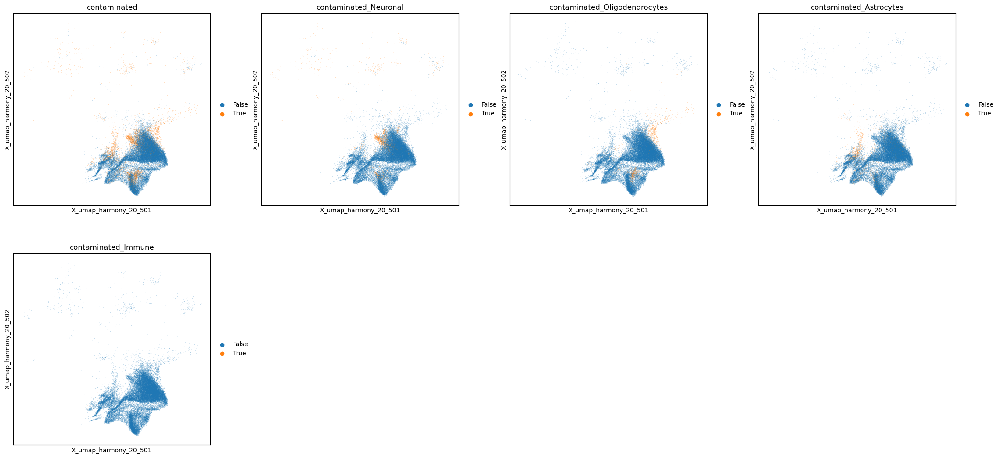

In [14]:
# Flag contamination
logger.info("Filtering out contaminated cells...")
sub_adata = flag_contamination(
    sub_adata,
    contamination_markers,
    layer="volume_log1p_norm",
    absolute_min=1,
    z_threshold=2,
    logger=logger,
)

with rc_context({"figure.figsize": (6, 6)}):
    sc.pl.embedding(
        sub_adata,
        basis="X_umap_harmony_20_50",
        color=[
            "contaminated",
            "contaminated_Neuronal",
            "contaminated_Oligodendrocytes",
            "contaminated_Astrocytes",
            "contaminated_Immune",
        ],
        size=50000 / sub_adata.shape[0],
        show=False,
    )
    #plt.savefig(
    #    plot_path / "UMAP_cell_type_contaminations.png", dpi=150, bbox_inches="tight"
    #)
    plt.show()

sub_adata = sub_adata[~sub_adata.obs["contaminated"]].copy()

In [15]:
#! mamba install bioconda::harmonypy -y

In [16]:
# Re-process subset
logger.info("Re-processing vascular subset...")
sub_adata = clean_pca_umap(sub_adata, logger=logger)
sub_adata.X = sub_adata.layers["counts"]
assert np.issubdtype(sub_adata.X.dtype, np.integer)

sub_adata = normalize_counts(
    sub_adata, save_path=plot_path, seg_method=args.seg_method, logger=logger
)
sub_adata = pca_umap_single(
    sub_adata, n_neighbors=10, n_pcs=20, save_path=plot_path, logger=logger
)
sub_adata = integration_harmony(
    sub_adata,
    batch_key="slide",
    n_neighbors=10,
    n_pcs=20,
    save_path=plot_path,
    logger=logger,
)

2025-11-03 17:47:45,993 [INFO]: Re-processing vascular subset...
2025-11-03 17:47:45,996 [INFO]: Deleted adata.uns['X_umap_20_50']
2025-11-03 17:47:45,997 [INFO]: Deleted adata.uns['X_umap_harmony_20_50']
2025-11-03 17:47:45,998 [INFO]: Deleted adata.uns['X_umap_harmony_20_50_3d']
2025-11-03 17:47:45,999 [INFO]: Deleted adata.uns['neighbors_harmony_20_50']
2025-11-03 17:47:46,000 [INFO]: Deleted adata.uns['pca']
2025-11-03 17:47:46,071 [INFO]: Deleted adata.obsm['X_pca']
2025-11-03 17:47:46,103 [INFO]: Deleted adata.obsm['X_pca_harmony']
2025-11-03 17:47:46,136 [INFO]: Deleted adata.obsm['X_umap_20_50']
2025-11-03 17:47:46,168 [INFO]: Deleted adata.obsm['X_umap_harmony_20_50']
2025-11-03 17:47:46,201 [INFO]: Deleted adata.obsm['X_umap_harmony_20_50_3d']
2025-11-03 17:47:46,202 [INFO]: Deleted adata.varm['PCs']
2025-11-03 17:47:46,203 [INFO]: Deleted adata.obsp['neighbors_harmony_20_50_connectivities']
2025-11-03 17:47:46,204 [INFO]: Deleted adata.obsp['neighbors_harmony_20_50_distances

In [17]:
logger.info("Annotating EC zonation subtypes...")
# Step 1: score marker genes
sub_adata = score_cell_types(
    sub_adata, selected_EC_subtypes, top_n_genes=10, layer="volume_log1p_norm"
)
# Step 2: assign each cell by max scoring subtype
sub_adata = annotate_cells_by_score(
    sub_adata, selected_EC_subtypes, out_col="ec_zonation", score_threshold=0.15
)

2025-11-03 17:52:03,023 [INFO]: Annotating EC zonation subtypes...


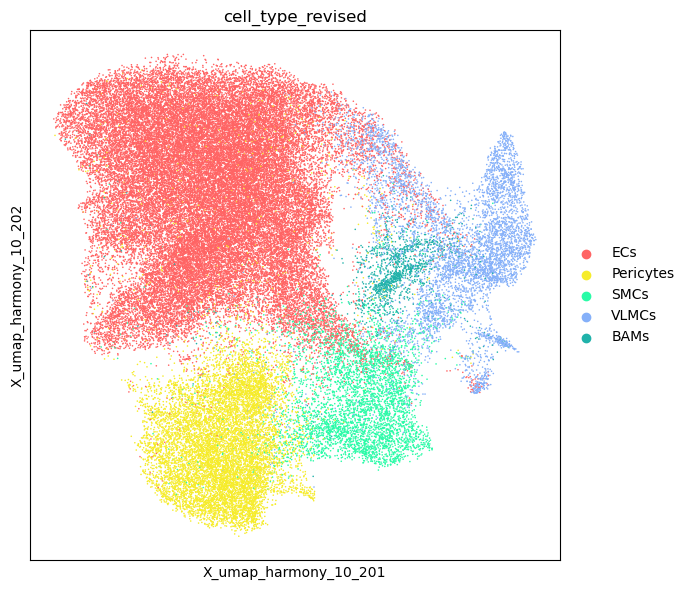

In [18]:
with rc_context({"figure.figsize": (7, 6)}):
    sc.pl.embedding(
        sub_adata,
        basis="X_umap_harmony_10_20",
        color="cell_type_revised",
        size=320000 / sub_adata.shape[0],
        show=False,
    )
    plt.tight_layout()
    plt.show()

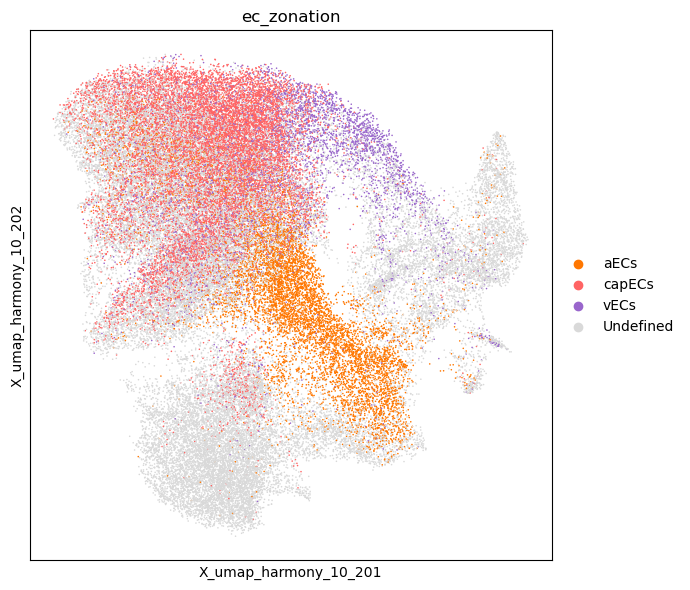

In [19]:
sub_adata.obs["ec_zonation"] = pd.Categorical(
    sub_adata.obs["ec_zonation"], categories=list(cell_type_colors.keys())
).remove_unused_categories()
sub_adata.uns["ec_zonation_colors"] = [
    cell_type_colors[ct] for ct in sub_adata.obs["ec_zonation"].cat.categories
]

with rc_context({"figure.figsize": (7, 6)}):
    sc.pl.embedding(
        sub_adata,
        basis="X_umap_harmony_10_20",
        color="ec_zonation",
        size=320000 / sub_adata.shape[0],
        show=False,
    )
    plt.tight_layout()
    #plt.savefig(
    #    plot_path_ecs / "UMAP_integrated_harmony_EC_scoring.png",
    #    dpi=150,
    #    bbox_inches="tight",
    #)
    plt.show()

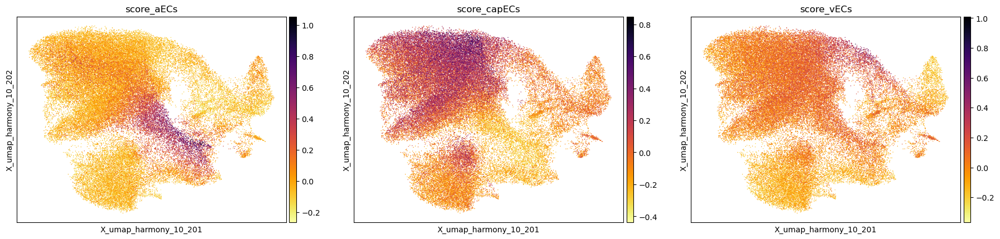

In [39]:
sc.pl.embedding(sub_adata, color=["score_aECs", "score_capECs", "score_vECs"], basis="X_umap_harmony_10_20", cmap="inferno_r", s=4)

In [40]:
counts = sub_adata.obs['ec_zonation'].value_counts()
logger.info(f"Value counts: {counts}")

2025-11-03 17:57:17,895 [INFO]: Value counts: ec_zonation
Undefined    35811
capECs       13994
aECs          7936
vECs          4549
Name: count, dtype: int64


In [41]:
# Subset and reprocess ECs
ec_adata = sub_adata[
    sub_adata.obs["ec_zonation"].isin(["capECs", "aECs", "vECs"])
].copy()
logger.info(f"Cells removed (non-ECs): {sub_adata.shape[0] - ec_adata.shape[0]}")
logger.info(f"Remaining ECs: {ec_adata.shape[0]}")

2025-11-03 17:57:19,900 [INFO]: Cells removed (non-ECs): 35811
2025-11-03 17:57:19,901 [INFO]: Remaining ECs: 26479


In [42]:
ec_adata.shape

(26479, 500)

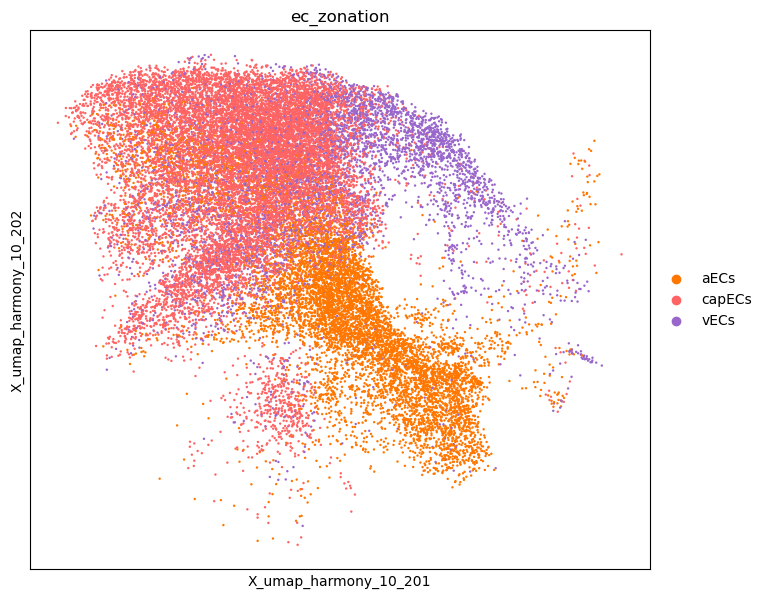

In [43]:
# Plot EC zonation
ec_adata.obs["ec_zonation"] = pd.Categorical(
    ec_adata.obs["ec_zonation"], categories=list(cell_type_colors.keys())
).remove_unused_categories()
ec_adata.uns["ec_zonation_colors"] = [
    cell_type_colors[ct] for ct in ec_adata.obs["ec_zonation"].cat.categories
]

with rc_context({"figure.figsize": (8, 7)}):
    sc.pl.embedding(
        ec_adata,
        basis="X_umap_harmony_10_20",
        color="ec_zonation",
        size=320000 / ec_adata.shape[0],
        show=False,
    )
    #plt.savefig(
    #    plot_path_ecs / "UMAP_reprocessed_ECs.png", dpi=150, bbox_inches="tight"
    #)
    plt.show()

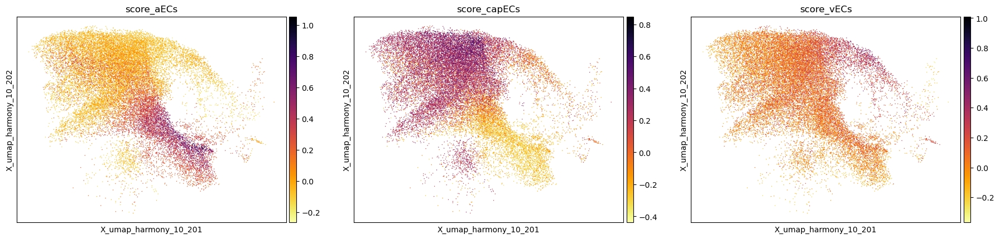

In [44]:
sc.pl.embedding(ec_adata, color=["score_aECs", "score_capECs", "score_vECs"], basis="X_umap_harmony_10_20", cmap="inferno_r", s=4)

In [45]:
# alternative embeddings

In [46]:
! mamba install bioconda::trimap -y
! pip install phate # bioconda-phate requires older python


Looking for: ['bioconda::trimap']

warning  libmamba Cache file "/home/ubuntu/miniforge3/pkgs/cache/497deca9.json" was modified by another program
warning  libmamba Cache file "/home/ubuntu/miniforge3/pkgs/cache/09cdf8bf.json" was modified by another program
warning  libmamba Cache file "/home/ubuntu/miniforge3/pkgs/cache/ffeee55f.json" was modified by another program
[+] 0.0s
bioconda/linux-64 (check zst) ━━━━━━━━━━━━━╸━   0.0 B @  ??.?MB/s Checking  0.0s[+] 0.1s
bioconda/linux-64 (check zst) ━━━━━━━━━━━━━━━   0.0 B @  ??.?MB/s Checking  0.1sbioconda/linux-64 (check zst)                       Checked  0.1s
warning  libmamba Cache file "/home/ubuntu/miniforge3/pkgs/cache/2a957770.json" was modified by another program
[+] 0.0s
bioconda/noarch (check zst) ━━━━╸━━━━━━━━━━━━   0.0 B @  ??.?MB/s Checking  0.0sbioconda/noarch (check zst)                         Checked  0.1s
[+] 0.0s
conda-forge/linux-64 ━━━━━━━━━━━━╸━━━━━━━━━━   0.0 B /  ??.?MB @  ??.?MB/s  0.0s[+] 0.1s
conda-forge/linux-6

In [47]:
%%time
sc.external.tl.trimap(ec_adata)

TRIMAP(n_inliers=10, n_outliers=5, n_random=5, distance=euclidean, lr=1000.0, n_iters=400, weight_adj=500.0, apply_pca=True, opt_method=dbd, verbose=True, return_seq=False)
running TriMap on 26479 points with dimension 50
pre-processing
found nearest neighbors
sampled triplets
running TriMap with dbd
Iteration:  100, Loss: 1217.688, Violated triplets: 0.0836
Iteration:  200, Loss: 1178.907, Violated triplets: 0.0809
Iteration:  300, Loss: 1158.361, Violated triplets: 0.0795
Iteration:  400, Loss: 1147.242, Violated triplets: 0.0788
Elapsed time: 0:00:21.525429
CPU times: user 32.5 s, sys: 3.26 s, total: 35.8 s
Wall time: 29.8 s


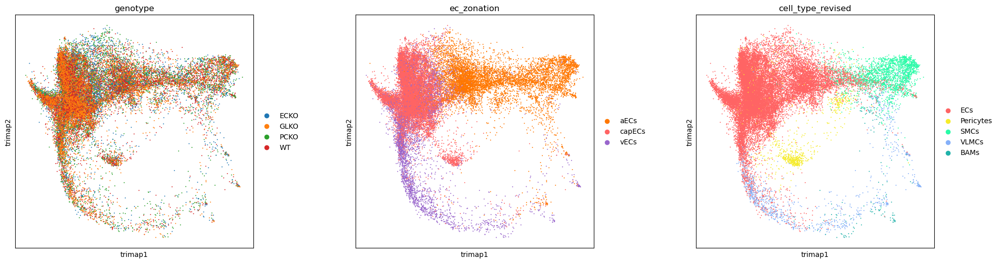

In [75]:
with rc_context({"figure.figsize": (6,6)}):
    sc.external.pl.trimap(ec_adata, color=["genotype", "ec_zonation", cell_type_col], wspace=0.3, s=8)

In [ ]:
with rc_context({"figure.figsize": (6,6)}):
    sc.external.pl.trimap(ec_adata, color=["score_aECs", "score_capECs", "score_vECs"], wspace=0.3, s=8)

In [49]:
%%time
sc.external.tl.phate(ec_adata)

/home/ubuntu/miniforge3/lib/python3.12/site-packages/phate/phate.py:208: FutureWarning: k is deprecated. Please use knn in future.
  warnings.warn("k is deprecated. Please use knn in future.", FutureWarning)
/home/ubuntu/miniforge3/lib/python3.12/site-packages/phate/phate.py:212: FutureWarning: a is deprecated. Please use decay in future.
  warnings.warn("a is deprecated. Please use decay in future.", FutureWarning)


    SGD-MDS may not have converged: stress changed by -11.1% in final iterations. Consider increasing n_iter or adjusting learning_rate.
CPU times: user 2min 26s, sys: 2.54 s, total: 2min 29s
Wall time: 55 s


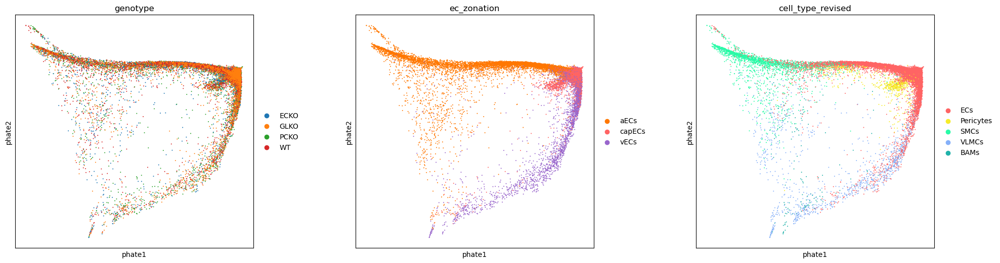

In [74]:
with rc_context({"figure.figsize": (6,6)}):
    sc.external.pl.phate(ec_adata, color=["genotype", "ec_zonation", cell_type_col], wspace=0.3, s=8)

In [51]:
%%time
sc.external.tl.phate(sub_adata)

/home/ubuntu/miniforge3/lib/python3.12/site-packages/phate/phate.py:208: FutureWarning: k is deprecated. Please use knn in future.
  warnings.warn("k is deprecated. Please use knn in future.", FutureWarning)
/home/ubuntu/miniforge3/lib/python3.12/site-packages/phate/phate.py:212: FutureWarning: a is deprecated. Please use decay in future.
  warnings.warn("a is deprecated. Please use decay in future.", FutureWarning)


CPU times: user 6min 13s, sys: 12.6 s, total: 6min 25s
Wall time: 3min 3s


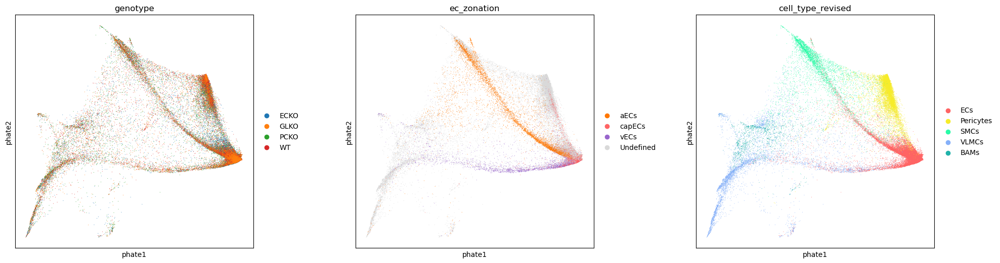

In [60]:
with rc_context({"figure.figsize": (6,6)}):
    sc.external.pl.phate(sub_adata, color=["genotype", "ec_zonation", cell_type_col], wspace=0.3)

In [53]:
#%%time
#sc.external.tl.palantir(ec_adata)

In [54]:
#sc.tl.tsne(ec_adata, n_pcs=2, use_rep="X_palantir_multiscale")#, perplexity=150)
#sc.pl.tsne(ec_adata, color=["sample", "ec_zonation", cell_type_col])

In [27]:
# alternative (not in script)
# subset to selected markers (vascular, cell cycle)

In [28]:
from cellseg_benchmark import _constants
supertype_markers = _constants.cell_supertypes_merfish_panel_500_mouse_brain
cell_cycle_genes = [g for genes in _constants.cell_cycle_genes.values() for g in genes]

In [29]:
sub_adata = sub_adata[:, sub_adata.var_names.isin(supertype_markers["Vascular"]+cell_cycle_genes)].copy()
#adata = adata[:, adata.var_names.isin(supertype_markers["Vascular"]+supertype_markers["Immune"]+cell_cycle_genes)].copy()

In [30]:
sub_adata.shape

(62290, 192)

In [31]:
# Re-process subset
logger.info("Re-processing vascular subset using selected markers (vascular and cell cycle)...")
sub_adata = clean_pca_umap(sub_adata, logger=logger)
sub_adata.X = sub_adata.layers["counts"]
assert np.issubdtype(sub_adata.X.dtype, np.integer)

sub_adata = normalize_counts(
    sub_adata, save_path=plot_path, seg_method=args.seg_method, logger=logger
)
sub_adata = pca_umap_single(
    sub_adata, n_neighbors=10, n_pcs=20, save_path=None, logger=logger
)
sub_adata = integration_harmony(
    sub_adata,
    batch_key="slide",
    n_neighbors=10,
    n_pcs=20,
    save_path=None,
    logger=logger,
)

2025-11-03 15:22:43,361 [INFO]: Re-processing vascular subset using selected markers (vascular and cell cycle)...
2025-11-03 15:22:43,363 [INFO]: Deleted adata.uns['pca']
2025-11-03 15:22:43,365 [INFO]: Deleted adata.uns['X_umap_10_20']
2025-11-03 15:22:43,365 [INFO]: Deleted adata.uns['neighbors_harmony_10_20']
2025-11-03 15:22:43,366 [INFO]: Deleted adata.uns['X_umap_harmony_10_20']
2025-11-03 15:22:43,367 [INFO]: Deleted adata.uns['X_umap_harmony_10_20_3d']
2025-11-03 15:22:43,439 [INFO]: Deleted adata.obsm['X_pca']
2025-11-03 15:22:43,472 [INFO]: Deleted adata.obsm['X_umap_10_20']
2025-11-03 15:22:43,505 [INFO]: Deleted adata.obsm['X_pca_harmony']
2025-11-03 15:22:43,538 [INFO]: Deleted adata.obsm['X_umap_harmony_10_20']
2025-11-03 15:22:43,570 [INFO]: Deleted adata.obsm['X_umap_harmony_10_20_3d']
2025-11-03 15:22:43,571 [INFO]: Deleted adata.varm['PCs']
2025-11-03 15:22:43,573 [INFO]: Deleted adata.obsp['neighbors_harmony_10_20_distances']
2025-11-03 15:22:43,574 [INFO]: Deleted a

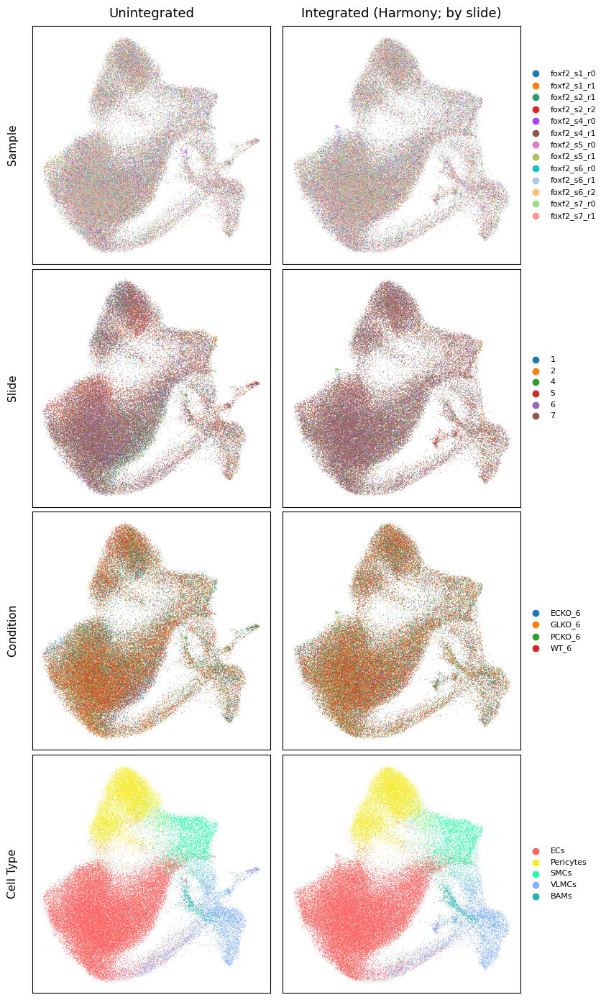

In [32]:
plot_integration_comparison(
    sub_adata,
    save_path=None,
    umap_key="X_umap_harmony_10_20",
    batch_key="slide",
    point_size_factor=100000,
)

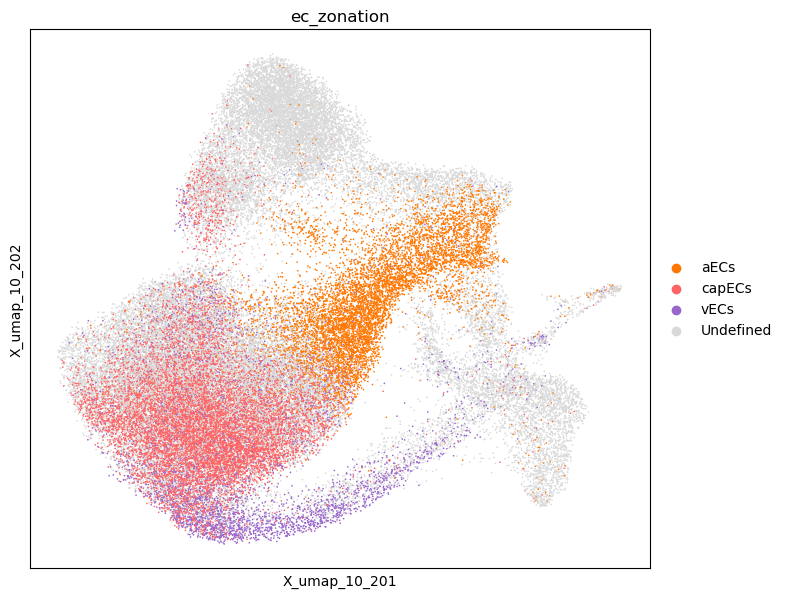

In [33]:
with rc_context({"figure.figsize": (8, 7)}):
    sc.pl.embedding(
        sub_adata,
        basis="X_umap_10_20",
        color="ec_zonation",
        size=150000 / ec_adata.shape[0],
        show=False,
    )
    #plt.savefig(
    #    plot_path_ecs / "UMAP_reprocessed_ECs.png", dpi=150, bbox_inches="tight"
    #)
    plt.show()

further tests..

In [50]:
logger.info("Subsetting and reprocessing EC subtypes...")
ec_adata = adata[adata.obs['ec_zonation'].isin(["capECs", "aECs", "vECs"])].copy()
logger.info(f"Cells removed (non-ECs): {adata.shape[0]-ec_adata.shape[0]}")
logger.info(f"Remaining ECs: {ec_adata.shape[0]}")

2025-08-28 16:19:25,074 [INFO]: Subsetting and reprocessing EC subtypes...
2025-08-28 16:19:25,456 [INFO]: Cells removed (non-ECs): 24678
2025-08-28 16:19:25,457 [INFO]: Remaining ECs: 35329


In [51]:
ec_adata = clean_pca_umap(ec_adata)
ec_adata.X = ec_adata.layers["counts"]
assert np.issubdtype(ec_adata.X.dtype, np.integer)

In [53]:
plot_path_ecs = plot_path_selected_features / "ec-subset"
plot_path_ecs.mkdir(parents=True, exist_ok=True)

In [54]:
ec_adata = normalize_counts(
    ec_adata, 
    save_path = plot_path_ecs,
    seg_method = args.seg_method,
    trim_outliers = False,
    logger = logger
)

2025-08-28 16:24:12,244 [INFO]: Normalizing counts...
/home/ubuntu/miniforge3/lib/python3.12/functools.py:909: UserWarning: zero-centering a sparse array/matrix densifies it.
  return dispatch(args[0].__class__)(*args, **kw)


In [55]:
ec_adata = dimensionality_reduction(ec_adata, save_path=plot_path_ecs, point_size_factor=130000, logger=logger)

2025-08-28 16:24:14,946 [INFO]: Dimensionality reduction: PCA, n_jobs=1
2025-08-28 16:24:17,260 [INFO]: Dimensionality reduction: UMAP with n_neighbors=10 and n_pcs=20
2025-08-28 16:24:43,100 [INFO]: Dimensionality reduction: UMAP with n_neighbors=15 and n_pcs=40
2025-08-28 16:25:15,231 [INFO]: Dimensionality reduction: UMAP with n_neighbors=20 and n_pcs=50


In [56]:
# Use the dictionary keys as the cell type order
ec_adata.obs["ec_zonation"] = pd.Categorical(
    ec_adata.obs["ec_zonation"], categories=list(cell_type_colors.keys())
)
ec_adata.obs["ec_zonation"] = ec_adata.obs["ec_zonation"].cat.remove_unused_categories()
# set colors for allen_cell_type
colors = [cell_type_colors[cat] for cat in ec_adata.obs["ec_zonation"].cat.categories]
ec_adata.uns["ec_zonation_colors"] = colors

In [57]:
with rc_context({'figure.figsize': (8,7)}):
    sc.pl.embedding(ec_adata, basis="X_umap_10_20", color="ec_zonation", 
                    size=320000/ec_adata.shape[0],
                    show=False)
    plt.savefig(
        os.path.join(plot_path_ecs, "UMAP_reprocessed_ECs.png"), dpi=150, bbox_inches="tight"
    )
    plt.close()

In [58]:
# run 3D UMAP (computation affects 2D components, therefore save separately)
sc.pp.neighbors(ec_adata, n_neighbors=10, n_pcs=20)
sc.tl.umap(ec_adata, neighbors_key="neighbors", key_added="X_umap_10_20_3D", n_components=3)
with rc_context({'figure.figsize': (8,8)}):
    sc.pl.embedding(ec_adata, basis="X_umap_10_20_3D", color=["sample", "ec_zonation", "cell_type_mmc_raw_revised"], 
                    alpha=0.2, wspace=0.1, projection='3d', show=False)
    plt.savefig(
        os.path.join(plot_path_ecs, "UMAP_reprocessed_ECs_3D.png"), dpi=150, bbox_inches="tight"
    )
    plt.close()

In [59]:
with rc_context({'figure.figsize': (7,6)}):
    sc.pl.embedding(ec_adata, basis="X_umap_10_20", color=['n_counts','n_genes', 'volume_final'], 
                    size=320000/ec_adata.shape[0], cmap='turbo',
                    show=False
                   )
    #plt.tight_layout()
    plt.savefig(
        os.path.join(plot_path_ecs, "UMAP_reprocessed_ECs_metadata.png"), dpi=100, bbox_inches="tight"
    )
    plt.close()

In [60]:
df = pd.crosstab(ec_adata.obs["condition"], ec_adata.obs["ec_zonation"], margins=True)
logger.info(f"Number of EC subtypes: \n{df}")

2025-08-28 16:26:32,096 [INFO]: Number of EC subtypes: 
ec_zonation   aECs  capECs  vECs    All
condition                              
ECKO_6        2916    3710  1068   7694
KO_6          2554    4691  1112   8357
PCKO_6        3499    5412  1325  10236
WT_6          2897    5114  1031   9042
All          11866   18927  4536  35329


In [61]:
df = pd.crosstab(
    ec_adata.obs["condition"],
    ec_adata.obs["ec_zonation"],
    normalize='index',
    margins=True
).mul(100).round(1)
df.to_csv(os.path.join(results_path, f"{today}_fraction_vasc_cells_per_condition_sum.csv"))
df

ec_zonation,aECs,capECs,vECs
condition,,,
ECKO_6,37.9,48.2,13.9
KO_6,30.6,56.1,13.3
PCKO_6,34.2,52.9,12.9
WT_6,32.0,56.6,11.4
All,33.6,53.6,12.8


In [62]:
df = pd.crosstab(
    [ec_adata.obs["condition"], ec_adata.obs["sample"]],
    ec_adata.obs["ec_zonation"],
    normalize='index',
    margins=True
).mul(100).round(1)
df.to_csv(os.path.join(results_path, f"{today}_fraction_vasc_cells_per_condition.csv"))
df

ec_zonation            aECs  capECs  vECs
condition sample                         
ECKO_6    foxf2_s1_r0  38.4    48.8  12.7
          foxf2_s4_r1  39.0    48.8  12.2
          foxf2_s5_r1  36.4    47.0  16.6
KO_6      foxf2_s6_r0  38.8    50.0  11.1
          foxf2_s6_r1  28.0    58.7  13.3
          foxf2_s7_r1  26.8    58.2  14.9
PCKO_6    foxf2_s2_r2  34.4    50.7  14.9
          foxf2_s4_r0  35.0    52.0  13.0
          foxf2_s5_r0  33.3    55.4  11.4
WT_6      foxf2_s2_r1  33.7    49.7  16.6
          foxf2_s6_r2  31.9    61.4   6.7
          foxf2_s7_r0  30.5    58.0  11.5
All                    33.6    53.6  12.8

In [46]:
#! mamba install bioconda::phate -y
#! mamba install bioconda::trimap -y


Looking for: ['bioconda::phate']

conda-forge/linux-64                                        Using cache
conda-forge/noarch                                          Using cache
bioconda/linux-64                                           Using cache
bioconda/noarch                                             Using cache

Pinned packages:
  - python 3.12.*


warning  libmamba Added empty dependency for problem type SOLVER_RULE_UPDATE
Could not solve for environment specs
The following package could not be installed
└─ phate is installable and it requires
   └─ scprep >=0.11.1  with the potential options
      ├─ scprep [0.12.0|0.12.1|0.12.2] would require
      │  └─ pandas >=0.19.0,<0.24  with the potential options
      │     ├─ pandas [0.19.0|0.19.1|...|0.23.4] would require
      │     │  └─ python [2.7* |>=2.7,<2.8.0a0 ], which can be installed;
      │     ├─ pandas [0.19.0|0.19.1|0.19.2|0.20.3] would require
      │     │  └─ python 3.4* , which can be installed;
      │     ├─ 

In [68]:
%%time
# PHATE
sc.external.tl.phate(ec_adata)

/home/ubuntu/miniforge3/lib/python3.12/site-packages/phate/phate.py:186: FutureWarning: k is deprecated. Please use knn in future.
  warnings.warn("k is deprecated. Please use knn in future.", FutureWarning)
/home/ubuntu/miniforge3/lib/python3.12/site-packages/phate/phate.py:190: FutureWarning: a is deprecated. Please use decay in future.
  warnings.warn("a is deprecated. Please use decay in future.", FutureWarning)


CPU times: user 13min 14s, sys: 3.53 s, total: 13min 18s
Wall time: 13min 6s


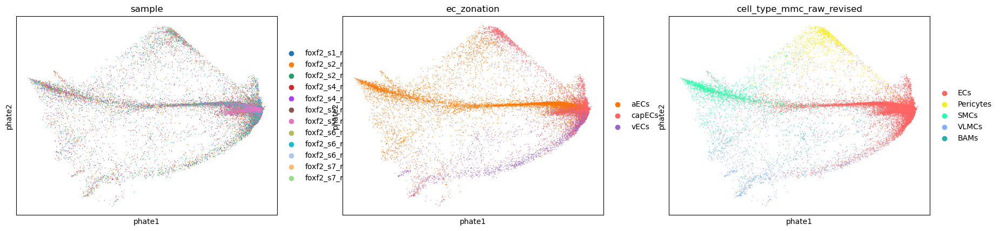

In [69]:
sc.external.pl.phate(ec_adata, color=["sample", "ec_zonation", "cell_type_mmc_raw_revised"])

In [74]:
%%time
# TriMap
sc.external.tl.trimap(ec_adata)

CPU times: user 8min 3s, sys: 471 ms, total: 8min 3s
Wall time: 4min 34s


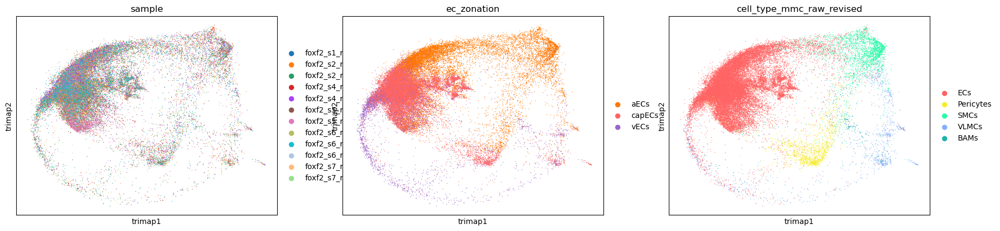

In [71]:
sc.external.pl.trimap(ec_adata, color=["sample", "ec_zonation", "cell_type_mmc_raw_revised"])

In [ ]:
%%time
# tSNE
sc.tl.tsne(ec_adata)

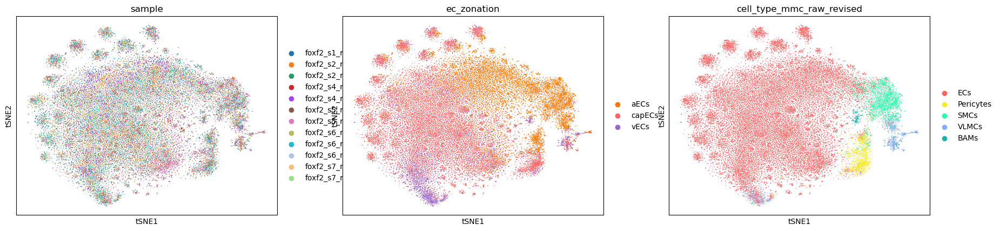

In [75]:
sc.pl.tsne(ec_adata, color=["sample", "ec_zonation", "cell_type_mmc_raw_revised"])

In [ ]:
%%time
# Palantir

In [55]:
! mamba install bioconda::palantir -y


Looking for: ['bioconda::palantir']

bioconda/linux-64                                           Using cache
bioconda/noarch                                             Using cache
[+] 0.0s
conda-forge/linux-64 ━━━━━━━━━━╸━━━━━━━━━━━━   0.0 B /  ??.?MB @  ??.?MB/s  0.0s[+] 0.1s
conda-forge/linux-64 ━━━━━━━━━━━╸━━━━━━━━━━━   0.0 B /  ??.?MB @  ??.?MB/s  0.1s
conda-forge/noarch   ━━━━━━━━━━━╸━━━━━━━━━━━   0.0 B /  ??.?MB @  ??.?MB/s  0.1s[+] 0.2s
conda-forge/linux-64 ━━━━━━━━━━━━━━━━━━━━━━━  59.3kB /  48.4MB @ 355.9kB/s  0.2s
conda-forge/noarch   ━━━━━━━━━━━━━━━━━━━━━━━ 294.9kB /  23.1MB @   1.8MB/s  0.2s[+] 0.3s
conda-forge/linux-64 ╸━━━━━━━━━━━━━━━━━━━━━━   3.5MB /  48.4MB @  12.8MB/s  0.3s
conda-forge/noarch   ━━━━━╸━━━━━━━━━━━━━━━━━   6.8MB /  23.1MB @  25.1MB/s  0.3s[+] 0.4s
conda-forge/linux-64 ━━━╸━━━━━━━━━━━━━━━━━━━   9.8MB /  48.4MB @  26.0MB/s  0.4s
conda-forge/noarch   ━━━━━━━━━━━━╸━━━━━━━━━━  13.2MB /  23.1MB @  35.2MB/s  0.4s[+] 0.5s
conda-forge/linux-64 ━━━━━━╸━━━━━━━━━━━━

In [82]:
sc.external.tl.palantir(ec_adata)

In [83]:
sc.tl.tsne(ec_adata, n_pcs=2, use_rep="X_palantir_multiscale", perplexity=150)

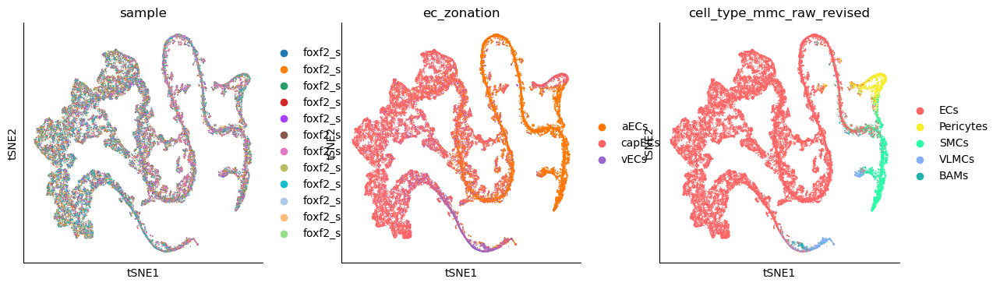

In [84]:
sc.pl.tsne(ec_adata, color=["sample", "ec_zonation", "cell_type_mmc_raw_revised"])

In [85]:
## start cell can be defined manually, see https://scanpy.readthedocs.io/en/latest/external/generated/scanpy.external.tl.palantir.html

In [76]:
logger.info("Merging EC subtypes back into vascular dataset...")

2025-11-03 18:13:35,225 [INFO]: Merging EC subtypes back into vascular dataset...


In [77]:
logger.info("Merging EC zonation subtypes back into vascular dataset...")
cell_type_zonation = "cell_type_incl_zonation"

if "ec_zonation" in sub_adata.obs.columns:
    sub_adata.obs = sub_adata.obs.drop(columns="ec_zonation")

2025-11-03 18:13:35,824 [INFO]: Merging EC zonation subtypes back into vascular dataset...


In [84]:
# transfer labels
sub_adata.obs = sub_adata.obs.merge(
    ec_adata.obs[["ec_zonation"]], left_index=True, right_index=True, how="left"
)
sub_adata.obs[cell_type_zonation] = (
    sub_adata.obs["ec_zonation"]
    .astype("object")
    .fillna(sub_adata.obs[cell_type_col].astype("object"))
)

# set "Undefined" for specific cell types without ec_adata annotation. these were removed as contamination.
missed_ECs_mask = sub_adata.obs["ec_zonation"].isna() & sub_adata.obs[
    cell_type_col
].isin(["ECs"])
sub_adata.obs.loc[missed_ECs_mask, cell_type_zonation] = "otherECs"

# convert back to categorical
sub_adata.obs[cell_type_zonation] = sub_adata.obs[cell_type_zonation].astype("category")
sub_adata.obs.drop(columns="ec_zonation", inplace=True)

In [85]:
# Set ordered categories and color map
sub_adata.obs[cell_type_zonation] = pd.Categorical(
    sub_adata.obs[cell_type_zonation], categories=list(cell_type_colors.keys())
).remove_unused_categories()

sub_adata.uns[f"{cell_type_zonation}_colors"] = [
    cell_type_colors[ct] for ct in sub_adata.obs[cell_type_zonation].cat.categories
]

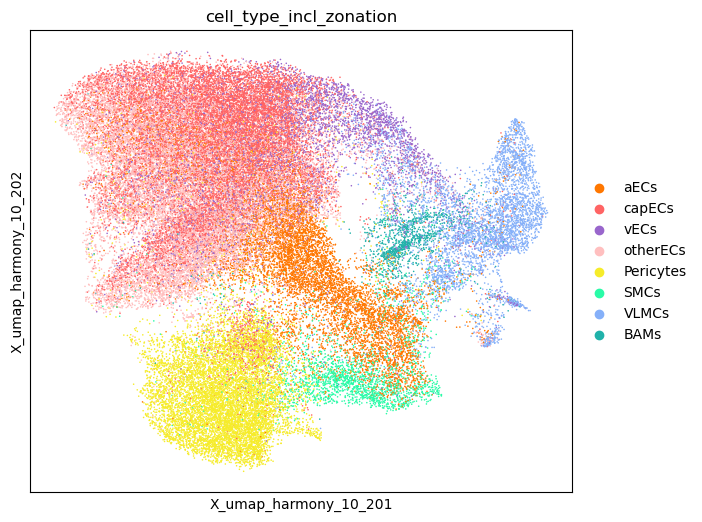

In [86]:
with rc_context({"figure.figsize": (7, 6)}):
    sc.pl.embedding(
        sub_adata,
        basis="X_umap_harmony_10_20",
        color=cell_type_zonation,
        size=320000 / sub_adata.shape[0],
        show=False,
    )
    #plt.savefig(
    #    plot_path / "UMAP_integrated_harmony_incl_zonation.png",
    #    dpi=150,
    #    bbox_inches="tight",
    #)
    plt.show()

In [87]:
logger.info("Exporting cell type proportions to csv...")
df = pd.crosstab(
    [sub_adata.obs["condition"], sub_adata.obs["sample"]],
    sub_adata.obs[cell_type_zonation],
    normalize="index",
).mul(100).round(1)#.to_csv(results_path / "fraction_vasc_cells_per_condition.csv")
df

2025-11-03 18:14:33,181 [INFO]: Exporting cell type proportions to csv...


cell_type_incl_zonation  aECs  capECs  vECs  otherECs  Pericytes  SMCs  VLMCs  \
condition sample                                                                
ECKO_6    foxf2_s1_r0    13.4    18.8   7.6      34.0       15.9   1.8    6.6   
          foxf2_s4_r1    13.1    18.6   7.2      34.1       15.7   3.3    7.1   
          foxf2_s5_r1    11.4    15.7   6.1      32.5       17.1   6.0    9.6   
GLKO_6    foxf2_s6_r0    15.8    18.6   6.6      35.0       15.3   2.9    4.9   
          foxf2_s6_r1    11.6    26.8   9.3      25.5       14.5   2.3    8.4   
          foxf2_s7_r1    11.5    30.6   9.8      21.5       14.5   2.5    7.1   
PCKO_6    foxf2_s2_r2    11.7    20.4   7.7      33.6       14.8   3.3    6.1   
          foxf2_s4_r0    13.2    23.6   8.1      26.9       13.8   4.0    7.9   
          foxf2_s5_r0    12.5    23.6   5.4      31.1       15.7   3.1    6.0   
WT_6      foxf2_s1_r1    12.4    17.6   7.0      34.2       16.5   3.8    6.4   
          foxf2_s2_r1    11.9    18.9   8.4      30.7       15.4   5.3    7.3   
          foxf2_s6_r2    14.9    28.9   4.7      25.4       16.2   2.2    6.2   
          foxf2_s7_r0    12.6    27.5   6.8      26.6       14.9   4.0    6.6   

cell_type_incl_zonation  BAMs  
condition sample               
ECKO_6    foxf2_s1_r0     1.9  
          foxf2_s4_r1     0.9  
          foxf2_s5_r1     1.6  
GLKO_6    foxf2_s6_r0     1.0  
          foxf2_s6_r1     1.6  
          foxf2_s7_r1     2.5  
PCKO_6    foxf2_s2_r2     2.3  
          foxf2_s4_r0     2.3  
          foxf2_s5_r0     2.6  
WT_6      foxf2_s1_r1     2.2  
          foxf2_s2_r1     2.1  
          foxf2_s6_r2     1.4  
          foxf2_s7_r0     1.0

In [88]:
df = pd.crosstab(
    sub_adata.obs["condition"], sub_adata.obs[cell_type_zonation], normalize="index"
).mul(100).round(1).to_csv(results_path / "fraction_vasc_cells_per_condition_sum.csv")
df

In [89]:
sub_adata.obs[cell_type_zonation].value_counts()

cell_type_incl_zonation
otherECs     18624
capECs       13994
Pericytes     9573
aECs          7936
vECs          4549
VLMCs         4331
SMCs          2128
BAMs          1155
Name: count, dtype: int64

In [ ]:
logger.info("Exporting spatial plots...")
for sample in sub_adata.obs["sample"].unique():
    with rc_context({"figure.figsize": (10, 10)}):
        sc.pl.embedding(
            sub_adata[sub_adata.obs["sample"] == sample],
            basis="spatial_microns",
            color=cell_type_zonation,
            size=9,
            title=sample,
            show=False,
        )
        plt.savefig(
            plot_path_spat / f"Spatial_{sample}.png", dpi=500, bbox_inches="tight"
        )
        plt.show()

In [65]:
#logger.info("Saving re-processed vascular subset to h5ad...")
sub_adata.obs["fov"] = sub_adata.obs.get("fov", "").astype(str)
sub_adata.write(adata_path / "adata_integrated_vascular.h5ad.gz", compression="gzip")#

#logger.info("Done.")

'/dss/dssfs03/pn52re/pn52re-dss-0001/cellseg-benchmark/analysis/foxf2/Cellpose_1_nuclei_model/plots/vascular-subtypes/Spatial'